## Рынок заведений общественного питания Москвы ##

**Описание проекта**

<a id='step1'></a>

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия будущего заведения.

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

**Цель исследования**. Подобрать для инвесторов оптимальное место для открытия кофейни

**Задачи исследования**:

1. Загрузить данные и подготовить к анализу
2. Провести анализ данных
3. Провести детальный анализ рынка кофеен
4. Подготовить презентацию

**Исходные данные**. Датасет moscow_places.csv, хранящий информацию о заведениях общественного питания в Москве

**Структура проекта**:

* [Введение](#step1)
* [Шаг 1. Открытие файла](#step2)
* [Шаг 2. Предобработка данных](#step3)
* [Шаг 3. Анализ данных](#step4)
* [Детализируем исследование: открытие кофейни](#step5)
* [Выводы](#step6)


## Шаг 1. Открытие файла ##

<a id='step2'></a>

Датафрейм состоит из 8406 строк и 14 столбцов и содержит информацию о заведениях общепита в Москве.

Присутствуют пропущенные значения в столбцах с временем работы, ценником, средним чеком, цена за чашку кофе, количество посадочных мест.

Данные представлены в форматах float, object, int.

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import datetime as dt
from plotly import graph_objects as go
import json
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster
import plotly.express as px
import os
%matplotlib inline

In [2]:
def read_file(file_name):
    path1 = os.path.join('/datasets', file_name)
    path2 = os.path.join(file_name)
    if os.path.exists(path1):
        data = pd.read_csv(path1)
        return data
    elif os.path.exists(path2):
        data = pd.read_csv(path2)
        return data
    else:
        print('File is not found')

In [3]:
data = read_file('moscow_places.csv')

Также в начале откроем файл картой округов Москвы, он понадобится нам позднее

In [4]:
with open(r'C:\Users\wwwvo\jupiter_projects\jupiter_projects\yandex\catering_market_analysis\admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
    geo_json = json.load(f)

Посчитаем размер датафрейма

In [5]:
data.shape

(8406, 14)

Выведем первые 5 строк

In [6]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Выведем информацию о датафрейме

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


## Шаг 2. Предобработка данных ##

<a id='step3'></a>

**Выводы по разделу**:

* Явных дубликатов не обнаружено;
* Неявных дубликатов также не обнаружено;
* Обнаружены пропущенные значения в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats, оставим их как есть, они не будут мешать нам в дальнейших расчетах;
* Были созданы столбцы с названиями улиц, и столбец с булевым значением, работает ли заведение круглосуточно

**Работа с дубликатами**

Проверим наличие явных дубликатов:

*Явные дубликаты не обнаружены*

In [8]:
data.duplicated().sum()

0

Всего обнаружено 5614 уникальных названий заведений. Проверить есть ли среди них неявные дубликаты, например, название заведения написали с ошибкой, - трудно, будем полагаться, что данные вводились верно

In [9]:
data['name'].nunique()

5614

In [10]:
data.loc[data['name'].str.contains('Яндекс')].agg({'name':'unique'})

name    [Яндекс Лавка, Яндекс.Лавка, Яндекс Еда]
dtype: object

Заведений, записанных дважды на тот же адрес не обнаружено

In [11]:
data[['name', 'address']].duplicated().sum()

0

Обнаружено 2367 строк с одинаковыми названиями и категорией - скорее всего данные заведения являются сетевыми

In [12]:
data[['name', 'category']].duplicated().sum()

2367

**Работа с пропусками**

* hours. Пропуски в данном столбце следует оставить, так как некорректно будет заполнить их чем-либо.
* price. В данном столбце можно было бы попробовать вставить значения, если мы знаем средний чек заведения. Но пропущенные значения не мешают нам в дальнейших расчетах, поэтому оставим, как есть.
* avg_bill, middle_avg_bill, middle_coffee_cup, seats. Заполнение пропусков будет некорректным

Создание столбца street

In [13]:
def street(row):
    return row['address'].split(',')[1]
data['street'] = data.apply(street, axis=1)

Создание столбца is_24/7

In [14]:
is_24 = data.loc[data['hours'] == 'ежедневно, круглосуточно']
is_24.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.0,Левобережная улица
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд


Показатель широты у каждого заведения разный, поэтому для создания столбца is_24/7 прибегнем к его помощи. 2 строки True и False, 8404 оставшихся - дубликаты

In [15]:
data['lat'].isin(is_24['lat']).duplicated().sum()

8404

In [16]:
data['is_24/7'] = data['lat'].isin(is_24['lat'])

## Шаг 3. Анализ данных ##

<a id='step4'></a>

**Выводы по разделу**:

* Наибольше количество заведений представлено в категориях кафе и рестораны;
* Наибольшее количество посадочных мест в ресторанах;
* Большая часть заведений - несетевых;
* Наиболее популярные сетевые заведения: Шоколадница, Доминос Пицца, Додо пицца.
* Наиболее популярные сетевые заведения относятся к категориям: кофейня и пиццерия.
* Явным лидером по числу заведений во всех категориях является ЦАО. Наибольший вклад вносят рестораны, кафе, кофейни, бары и пабы.
* ЦАО - единственный округ, в котором наибольшее число заведений относится к ресторанам. В остальных округах лидером является кафе.
* Средний рейтинг не сильно зависит от категории заведения;
* Самый большой чек в ЦАО и ЗАО

Рассмотрим, в каких количествах представлены заведения из категорий датафрейма.

Лидирует кафе, за ним рестораны и кофейни. Замыкает рейтинг - булочные

In [17]:
data_categ = data.groupby('category', as_index=False).agg({'name':'nunique'}).sort_values(by='name', ascending=False)
data_categ.reset_index(drop=True, inplace=True)
data_categ = data_categ.rename(columns={'name':'amount'})
data_categ

,category,amount
0,кафе,1760
1,ресторан,1550
2,кофейня,839
3,"бар,паб",683
4,быстрое питание,454
5,пиццерия,367
6,столовая,246
7,булочная,140


Построим график распределения заведений по категориям. Кафе и рестораны - явные лидеры 

In [18]:
def build_bar(x, y, df, title_bar, xlab, ylab):
    sns.set_style('white')
    plt.figure(figsize=(10, 3))
    sns.barplot(x=x, y=y, data=df)
    plt.title(title_bar, fontsize=13)
    plt.xlabel(xlab, fontsize=11)
    plt.ylabel(ylab, fontsize=11)
    plt.xticks(fontsize=8)
    plt.yticks(fontsize=8)
    plt.show()
    

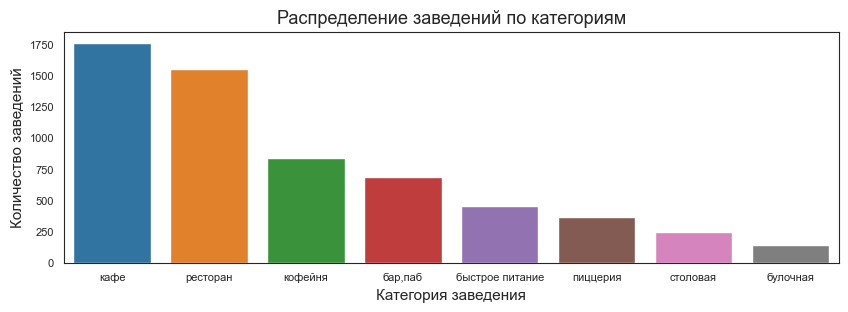

In [19]:
build_bar('category', 'amount', data_categ, 'Распределение заведений по категориям'\
          , 'Категория заведения', 'Количество заведений')

**Исследуем количество посадочных мест в заведениях.**

Для начала посмотрим общую статистическую информацию. В среднем мы имеем 108 мест распределением от 0 до 1288

В датафрейме присутствует 136 заведений без посадочных мест, есть ли в этом ошибка? По уникальным названиям можно сделать вывод, что большинство из этих заведений - забегаловки, поэтому возможно во многих из них действительно нет посадочных мест, но стоит учесть, что в ряде случаев возможна ошибка

In [20]:
data.loc[data['seats'] == 0].shape

(136, 16)

In [21]:
data.loc[data['seats'] == 0]['name'].unique()

array(['Meat Doner Kebab', 'Арамье', 'Донер-Шашлык', 'Тандыр № 1',
       'Неаполитан пицца', 'Пекарня&Донер', 'Центр Плов', 'Шаурма',
       'Everest Coffee', 'Пекарня Маковка', 'Паб 28/13', 'Рандеву',
       'Огонек', 'Кофе с собой А&M', 'Пекарня 24', 'Sushi-das.ru',
       'Халяль', 'Стейки Bar-B-Que', 'Дом плова', 'Кулинария',
       'Нуш донер', "Домино'с Пицца", 'Кулинария Виктория',
       'Сладкая параллель', 'Рожь Хлеб и Кофе', 'Афросиаб', 'ПекарняУз',
       'Шаурма и Таук', 'I-cup', 'French Bakery', 'Тимир', 'Cofix',
       'Wild Bean Cafe', '9 Bar Coffee', 'Сказка Египта', 'Street coffee',
       'Coffee in', 'О! Фобо', 'Намшон', 'Пицца и гирос', 'Шаверма',
       'Кофе с собой', 'Вьетнамская кухня', 'Органик', 'Здоровое Питание',
       'КлинКом', 'Andy Coffee', 'Моремэй', 'ДетиЛенд', 'СушиСтор',
       'Чайхана', 'КИНОпицца', 'Sugarbey', 'Семетей', 'Яндекс Лавка',
       'Чайхана Семетей', 'Мангал', 'Стумари', 'Таманно', 'Signature',
       'Мысли кофе', 'Elephantkids', '

In [22]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Построим гистограмму распределения посадочных мест. Как мы видим, большая часть заведений имеет меньше 100 посадочных мест, а с 350 начинаются выбросы.

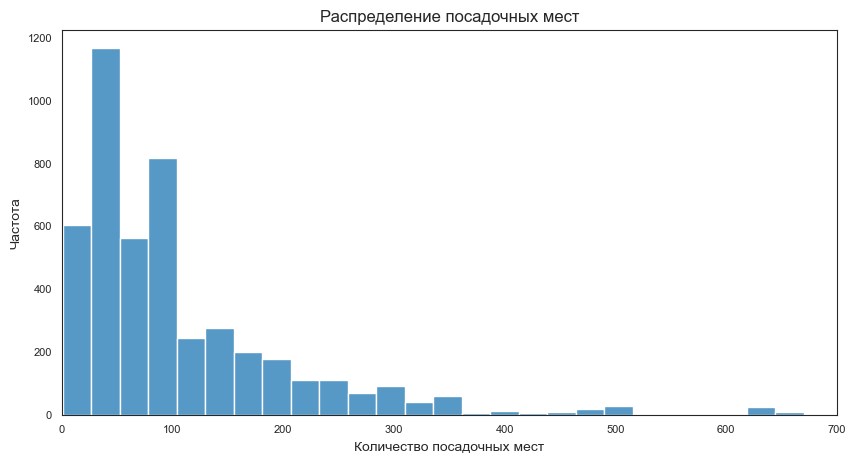

In [23]:
plt.figure(figsize=(10, 5))
sns.histplot(x='seats', data=data.query('seats != 0'), bins=50)
plt.title('Распределение посадочных мест')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Частота')
plt.xlim(0, 700)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.show()

Теперь рассмотрим подробнее количество мест по категориям:

Больше всего посадочных мест приходится на рестораны, бары и пабы, кофейни, столовые. Меньше всего на быстрое питание, кафе, пиццерии, булочные

In [24]:
data_seats = data.query('seats != 0').groupby('category').agg({'seats':'median'}).sort_values(by='seats', ascending=False)
data_seats

,seats
category,
ресторан,90.0
"бар,паб",84.0
кофейня,80.0
столовая,80.0
быстрое питание,75.0
кафе,60.0
пиццерия,56.0
булочная,52.0


Столбчатая диаграмма показывает ту же закономерность - разница в посадочных местах между ресторанами, барами и кофейнями - невелика. Булочные - снова в аутсайдерах

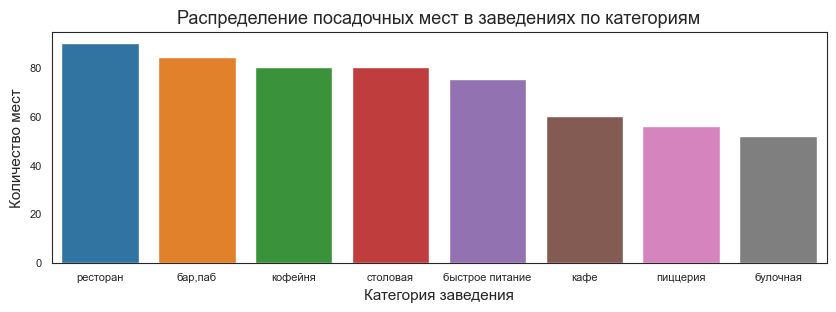

In [25]:
build_bar(data_seats.index, 'seats', data_seats, 'Распределение посадочных мест в заведениях по категориям'\
          , 'Категория заведения', 'Количество мест')

Рассмотрим соотношение сетевых и несетевых заведений

В датафрейме представлено 5201 несетевое заведение и 3205 сетевых. Несетевых заведений - большинство.

In [26]:
chain = data.groupby('chain').agg({'name':'count'})
chain

,name
chain,
0,5201
1,3205


In [27]:
fig = go.Figure(data=[go.Pie(labels=['Несетевые', 'Сетевые'], values=chain['name'], title='Распределение сетевых заведений')])
fig.show()

Теперь посмотрим на распределение сетевых и несетевых заведений по категориям:

* По количеству несетевых заведений лидируют кафе и рестораны;
* По количеству сетевых заведений больше всего относятся к кафе, ресторанам, кофейням - по числу отличаются не сильно;
* В таких заведениях, как кафе, рестораны, пабы и бары, быстрое питание, столовые большую долю имеют несетевые заведения;
* В кофейнях и пиццериях количество сетевых заведений немного превышает несетевые;
* Булочные имеют наибольшую долю сетевых заведений

In [28]:
data_chain = data.groupby(['category', 'chain'], as_index=False).agg({'name':'count'})
data_chain

,category,chain,name
0,"бар,паб",0,596
1,"бар,паб",1,169
2,булочная,0,99
3,булочная,1,157
4,быстрое питание,0,371
5,быстрое питание,1,232
6,кафе,0,1599
7,кафе,1,779
8,кофейня,0,693
9,кофейня,1,720


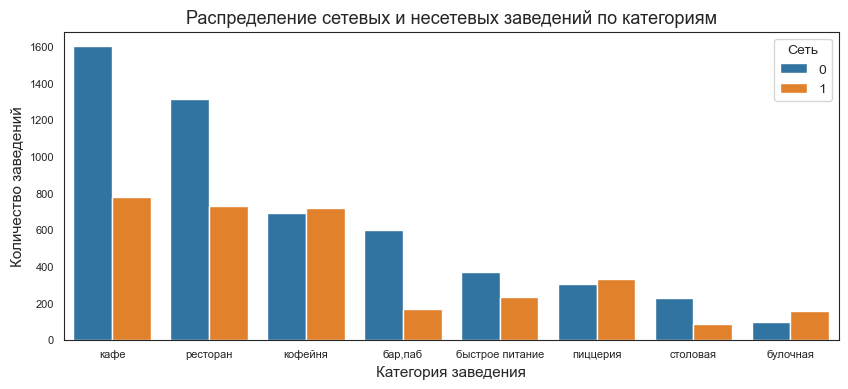

In [29]:
plt.figure(figsize=(10, 4))
sns.barplot(x='category', y='name', hue='chain', data=data_chain.sort_values(by='name', ascending=False))
plt.title('Распределение сетевых и несетевых заведений по категориям', fontsize=13)
plt.xlabel('Категория заведения', fontsize=11)
plt.ylabel('Количество заведений', fontsize=11)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.legend(title='Сеть')
plt.show()

Определим **Топ-15** самых популярных сетевых заведений Москвы.

* На первом месте с большим отрывом стоит Шоколадница, за ней 2 пиццерии - Доминос Пицца и Додо пицца.
* Наиболее популярные сетевые заведения относятся к категориям: кофейня и пиццерия.

In [30]:
data_top15 = data.query('chain == 1').groupby(['name', 'category'], as_index=False).agg({'lat':'count'})\
.sort_values(by='lat', ascending=False).head(15)
data_top15.columns = ['name', 'category', 'amount']
data_top15.reset_index(drop=True, inplace=True)
data_top15

,name,category,amount
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


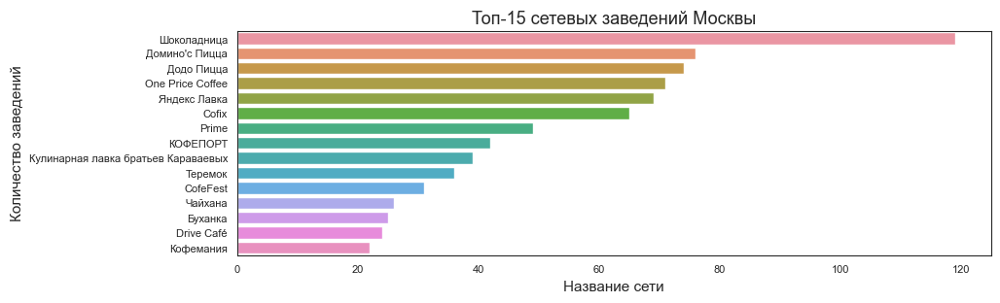

In [31]:
build_bar('amount', 'name', data_top15, 'Топ-15 сетевых заведений Москвы'\
          , 'Название сети', 'Количество заведений')

**Анализ районов**

Рассмотрим, в каких районах расположены заведения в нашем датафрейме.

В датафрейме представлено 9 округов Москвы и вот какие выводы можно по ним сделать:

* Явным лидером по числу заведений во всех категориях является ЦАО. Наибольший вклад вносят рестораны, кафе, кофейни, бары и пабы.
* Отастающиим округом является Северо-Западный.
* ЦАО - единственный округ, в котором наибольшее число заведений относится к ресторанам. В остальных округах лидером является кафе.


In [32]:
data_dis = data.groupby(['district', 'category'], as_index=False).agg({'name':'count'})

data_dis = data_dis.rename(columns = {'name':'name_count'})
data_dis.reset_index(drop=True, inplace=True)
data_dis.head(5)

,district,category,name_count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105


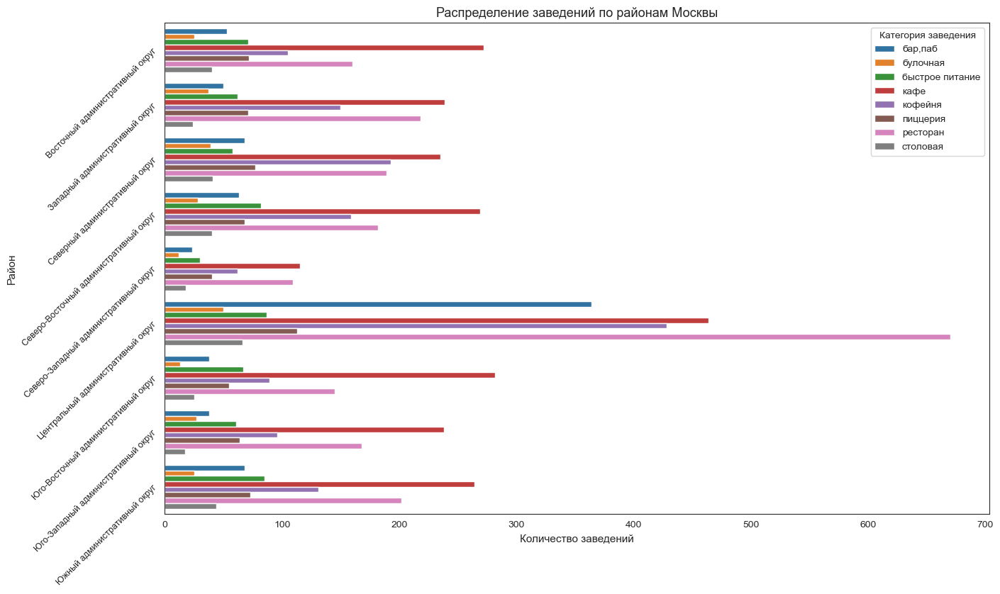

In [33]:
plt.figure(figsize=(15, 9))
sns.color_palette('coolwarm', 20)
sns.barplot(x='name_count', y='district', hue='category', data=data_dis)
plt.title('Распределение заведений по районам Москвы', fontsize=13)
plt.ylabel('Район', fontsize=11)
plt.xlabel('Количество заведений', fontsize=11)
plt.yticks(rotation=45, fontsize=9)
plt.legend(title='Категория заведения')
plt.show()

In [34]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


**Средний рейтинг по категориям заведений**

Построим boxplot для определения среднего рейтинга по категориям заведений. Наибольший рейтинг имеют бары и пабы. За ними следуют рестораны, кофейни, пиццерии, булочные и столовые, рейтинг которых не сильно отличается друг от друга. Наконец, следуют кафе и быстрое питание, хоть они и завершают рейтинг, но отстают от лидера не более чем на 0,1, поэтому говорить, что средний рейтинг сильно зависит от категории заведения, не следует.

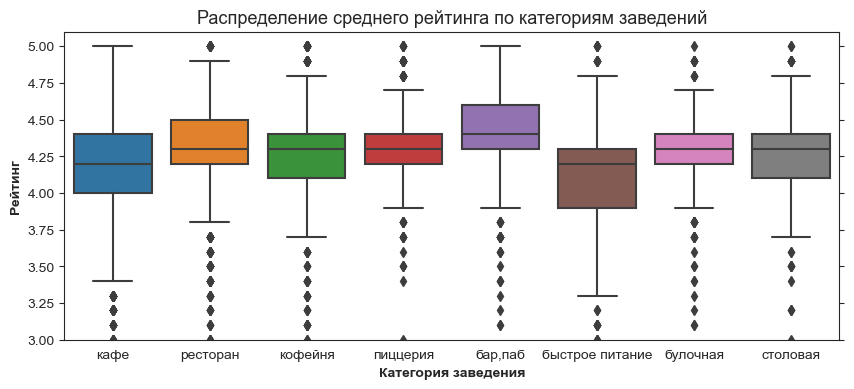

In [35]:
plt.figure(figsize=(10,4))
sns.boxplot(x='category', y='rating', data=data)
plt.title('Распределение среднего рейтинга по категориям заведений', fontsize=13)
plt.xlabel('Категория заведения', fontweight="bold")
plt.ylabel('Рейтинг', fontweight="bold")
plt.ylim(3, 5.1)
plt.tick_params(left=True, right=True)
plt.yticks()
plt.show()

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [36]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_json,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

Отобразим все заведения датасета на карте с помощью кластеров

In [37]:
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

Определим топ-15 улиц по количеству заведений. Несмотря на то, что в ЦАО большое количество различных заведений, лидерами являются улицы, находящиеся в других округах или слегка его затрагивает. Это связано с их большей протяженностью, в то время как в центре улицы не такие длинные.

In [38]:
data_top_street = data.groupby('street', as_index=False).agg({'name':'count'})\
.sort_values(by='name', ascending=False).head(15)
data_top_street.reset_index(drop=True, inplace=True)
data_top_street = data_top_street.rename(columns={'name':'amount'})
data_top_street

,street,amount
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


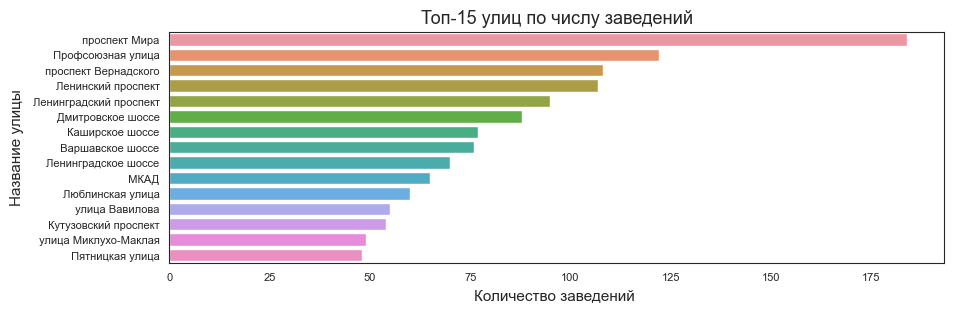

In [39]:
build_bar('amount', 'street', data_top_street, 'Топ-15 улиц по числу заведений'\
          , 'Количество заведений ', 'Название улицы')

Теперь найдем улицы, на которых находится только один объект общепита. Таких улиц оказалось целых 458, это может быть вызвано их малой протяженностью, отсутствием высокого потока людей на них. Можно сказать, что эти заведения являются монополистами на данных улицах

In [40]:
data_street_one = data.groupby('street', as_index=False).agg({'name':'count'})\
.sort_values(by='name')
data_street_one.reset_index(drop=True, inplace=True)
data_street_one = data_street_one.rename(columns={'name':'amount'})
data_street_one = data_street_one.query('amount == 1')
data_street_one.shape


(458, 2)

Теперь проведем анализ категорий таких заведений.

Ситуация изменилась не сильно, больше всего заведений, не имеющих конкурентов по улице - кафе, за ними - рестораны, кофейни и т.д. 


In [41]:
data_street_one = data_street_one.merge(data, on='street', how='left')
data_street_one.head(1)

,street,amount,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,NaN,1,20.0,True


In [42]:
data_street_one = data_street_one.groupby('category', as_index=False).agg({'amount':'sum'})\
.sort_values(by='amount', ascending=False)
data_street_one.reset_index(drop=True, inplace=True)
data_street_one

,category,amount
0,кафе,160
1,ресторан,93
2,кофейня,84
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


In [43]:
fig = px.bar(data_street_one, x='category', y='amount', color='category', title='Заведения без конкурентов по улице'\
             , text='amount')
fig.update_xaxes(tickangle=45)
fig.show() 

Посчитаем медианное значение чека для каждого района

In [44]:
data_dis_bill = data.groupby('district', as_index=False).agg({'middle_avg_bill':'median'})\
.sort_values(by='middle_avg_bill', ascending=False)
data_dis_bill.reset_index(drop=True, inplace=True)
data_dis_bill = data_dis_bill.rename(columns={'middle_avg_bill':'median_bill'})
data_dis_bill

,district,median_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


Теперь изобразим это на хороплете. На карте наглядно видно, что самый большой чек в ЦАО и ЗАО. Далее следуют все округа к западу и к северу от центра, также один восточный. Замыкают рейтинг округа к югу от центра и Северо-восточный.

In [45]:
moscow_lat, moscow_lng = 55.751244, 37.618423

map_bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_json,
    data=data_dis_bill,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(map_bill)

map_bill

## Детализируем исследование: открытие кофейни ##

<a id='step5'></a>

**Рекомендация по открытию кофейни**:

На мой взгляд, данных недостаточно для того, чтобы выйти на рынок общественного питания, желательно было бы ознакомиться с финансовой отчетностью конкурентов, знать проходимость места (а она может сильно разниться от улицы к улице внутри одного района), мнение местных жителей и работников, цена аренды и т.д. Поэтому в данной рекомендации я буду исходить из конкурентоспособности, а именно, сколько уже открыто кофеен в данном округе и средний рейтинг.

* **Количество уже открытых заведений**. Я не рекомендую выбирать районы, где уже открыто много кофеен. Нам подойдут Южный административный округ, Восточный административный округ, Юго-Западный административный округ, Юго-Восточный административный, Северо-Западный административный округ.
* **Средний рейтинг**. Чем ниже рейтинг кофеен в районе, тем больше шансов у нас завоевать лояльную аудиторию. Нам подойдут Северный административный округ, Центральный административный округ, Южный административный округ, Юго-Западный административный округ, Западный административный округ.
* **Работа 24/7**. В ЮВАО и ЮАО всего лишь по одной кофейни, работающих круглосуточно, конкуренции практически нет.
* **Количество посадочных мест**. Чем меньше мест, тем меньше конкуренция. Нам подходят Северо-Западный административный округ, Юго-Западный административный округ, Юго-Восточный административный округ.

Если исходить из перечисленных выше критериев я бы рекомендовал открытие круглосуточной кофейни в  ЮВАО с количеством посадочных мест больше 70. Чашка капучино будет стоить около 160 рублей.

Посчитаем количество кофеен в датасете - 839

In [46]:
data_categ.loc[data_categ['category'] == 'кофейня']

,category,amount
2,кофейня,839


Больше всего кофеен в ЦАО - 428, за ним следует САО - 193, СВАО - 159

In [47]:
data_dis_cof = data_dis.loc[data_dis['category'] == 'кофейня'].sort_values(by='name_count', ascending=False)
data_dis_cof.reset_index(drop=True, inplace=True)
data_dis_cof

,district,category,name_count
0,Центральный административный округ,кофейня,428
1,Северный административный округ,кофейня,193
2,Северо-Восточный административный округ,кофейня,159
3,Западный административный округ,кофейня,150
4,Южный административный округ,кофейня,131
5,Восточный административный округ,кофейня,105
6,Юго-Западный административный округ,кофейня,96
7,Юго-Восточный административный округ,кофейня,89
8,Северо-Западный административный округ,кофейня,62


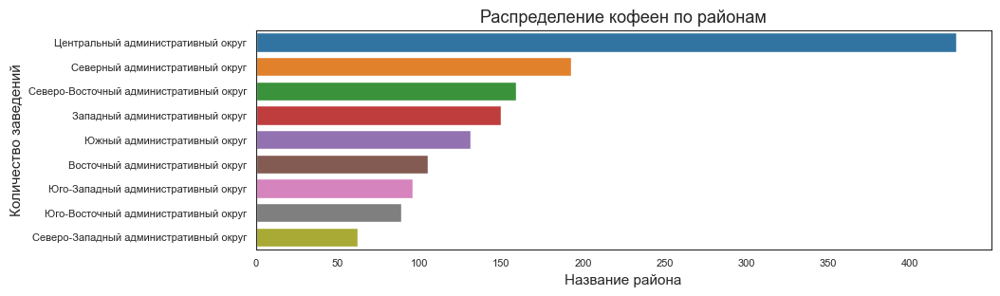

In [48]:
build_bar('name_count', 'district', data_dis_cof, 'Распределение кофеен по районам'\
          , 'Название района', 'Количество заведений')

64 кофейни работаю круглосуточно и без выходных

In [49]:
data.loc[(data['category'] == 'кофейня') & (data['is_24/7'] == True)].shape

(64, 16)

Больше всего круглосуточных кофеен в ЦАО. В ЮВАО и ЮАО всего лишь по одной кофейни, работающих круглосуточно.

In [50]:
data_cof_24 = data.loc[(data['category'] == 'кофейня') & (data['is_24/7'] == True)].groupby('district')\
.agg({'name':'count'}).sort_values(by='name')

data_cof_24

,name
district,
Юго-Восточный административный округ,1
Южный административный округ,1
Северо-Западный административный округ,2
Северо-Восточный административный округ,3
Восточный административный округ,5
Северный административный округ,5
Юго-Западный административный округ,7
Западный административный округ,10
Центральный административный округ,30


Также мы можем заметить, что большинство кофеен работающих круглосуточно, являются сетевыми.

In [51]:
data.loc[(data['category'] == 'кофейня') & (data['is_24/7'] == True)].groupby('chain').agg({'name':'count'})

,name
chain,
0,11
1,53


Построим хороплет для определения рейтинга кофеен по районам.

Как ни странно самый высокий рейтинг среди кофеен наблюдается в Восточном и Северо-Восточном округах, хоть им и далеко до ЦАО по количеству заведений. Неплохой рейтинг также у Северо-Западного округа и Юго-Восточного, остальные районы отстают.

In [52]:
m_cof = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=geo_json,
    data=data.loc[data['category'] == 'кофейня'],
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m_cof)

m_cof

Стоимость чашки капучино также возможно будет зависеть от района, проверим это:

Да, действительно, средняя стоимость чашки находится в диапазоне от 151 рубля (ЮВАО) до 190 рублей (ЗАО). Поэтому и стоиомость будет зависеть от района, в котором мы будем открывать.

In [53]:
data_cup = data.query('category == "кофейня"').groupby('district', as_index=False).agg({'middle_coffee_cup':'mean'})\
.sort_values(by='middle_coffee_cup', ascending=False)
data_cup.reset_index(drop=True, inplace=True)
data_cup = data_cup.rename(columns=({'middle_coffee_cup':'cup_mean'}))
data_cup

,district,cup_mean
0,Западный административный округ,189.938776
1,Центральный административный округ,187.518519
2,Юго-Западный административный округ,184.176471
3,Восточный административный округ,174.023810
4,Северный административный округ,165.789474
5,Северо-Западный административный округ,165.523810
6,Северо-Восточный административный округ,165.333333
7,Южный административный округ,158.488372
8,Юго-Восточный административный округ,151.088235


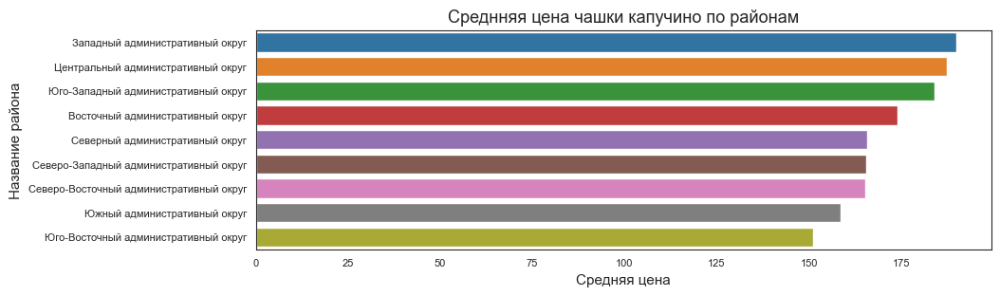

In [54]:
build_bar('cup_mean', 'district', data_cup, 'Среднняя цена чашки капучино по районам'\
          , 'Средняя цена', 'Название района')

Предлагаю дополнительно включить критерий наличия посадочных мест. В ЮВАО в кофейнях в среднем всего лишь 71 посадочное место, в то время как в ЗАО 153.


In [55]:
data_seats_caf = data.query('category == "кофейня"').groupby('district', as_index=False).agg({'seats':'mean'})\
.sort_values(by='seats', ascending=False)
data_seats_caf.reset_index(drop=True, inplace=True)
data_seats_caf

,district,seats
0,Западный административный округ,153.329670
1,Южный административный округ,124.973333
2,Северный административный округ,117.281818
3,Центральный административный округ,113.146789
4,Восточный административный округ,97.444444
5,Северо-Восточный административный округ,92.132530
6,Северо-Западный административный округ,87.352941
7,Юго-Западный административный округ,86.607143
8,Юго-Восточный административный округ,70.923077


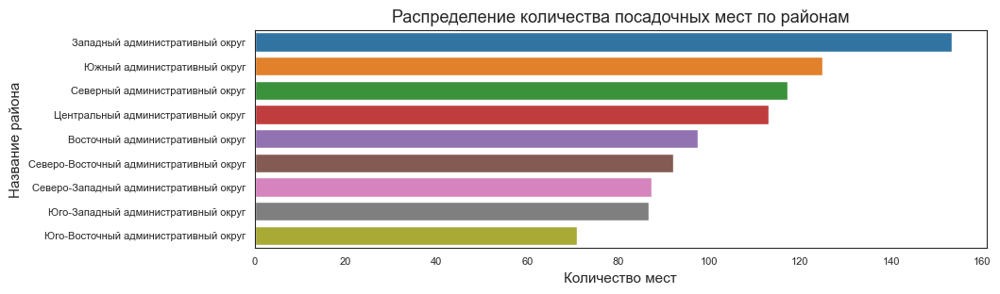

In [56]:
build_bar('seats', 'district', data_seats_caf, 'Распределение количества посадочных мест по районам'\
          , 'Количество мест', 'Название района')

## Вывод ##

<a id='step6'></a>

* Наибольше количество заведений представлено в категориях кафе и рестораны;
* Наибольшее количество посадочных мест в ресторанах;
* Большая часть заведений - несетевых;
* Наиболее популярные сетевые заведения: Шоколадница, Доминос Пицца, Додо пицца.
* Наиболее популярные сетевые заведения относятся к категориям: кофейня и пиццерия.
* Явным лидером по числу заведений во всех категориях является ЦАО. Наибольший вклад вносят рестораны, кафе, кофейни, бары и пабы.
* ЦАО - единственный округ, в котором наибольшее число заведений относится к ресторанам. В остальных округах лидером является кафе.
* Средний рейтинг не сильно зависит от категории заведения;
* Самый большой чек в ЦАО и ЗАО. 

Рекомендация: открывать круглосуточную кофейню в ЮВАО с количеством посадочных мест больше 70, стоимость чашки капучино составит около 160 рублей.

**Презентация**: https://drive.google.com/drive/folders/1c1ZfGjyAum9Oz4HXfrYqYyWuORCigyMX?usp=sharing